In [3]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

In [18]:

df = pd.read_csv('../data/priority_places_v1_2_decile_domains_WGS.csv',
                    dtype={'domain_supermarket_proximity':'category',
                        'domain_supermarket_transport':'category',
                        'domain_ecommerce_access':'category',
                        'domain_socio_demographic':'category',
                        'domain_nonsupermarket_proximity':'category',
                        'domain_food_for_families':'category',
                        'domain_fuel_poverty':'category', 
                        'combined': 'category'}
)

retailers = pd.read_csv('../data/retail_locations_glxv24_202206.csv')
#retailers['size_code'] = retailers['size_code'] / 4.

colormap = ['#0d0887',
            '#41049d',
            '#6a00a8',
            '#8f0da4',
            '#b12a90',
            '#c94a79',
            '#db6a68',
            '#e58858',
            '#e8a34a',
            '#e1bf40', 
            '#808080']


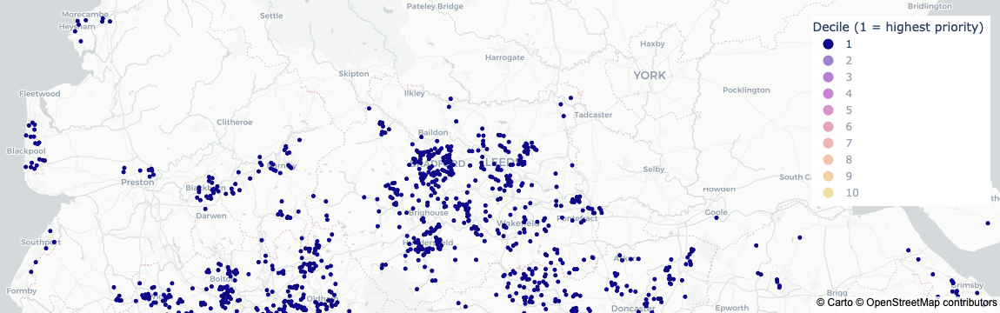

In [20]:
domain = 'combined'
fig = px.scatter_mapbox(
                    df, 
                    lat='latitude',
                    lon='longitude', 
                    color=domain, 
                    color_discrete_sequence=colormap,
                    custom_data=['geo_code', 
                                 'domain_supermarket_proximity',
                                 'domain_supermarket_transport',
                                 'domain_ecommerce_access',
                                 'domain_socio_demographic',
                                 'domain_nonsupermarket_proximity',
                                 'domain_food_for_families',
                                 'domain_fuel_poverty',
                                 'combined'],
                    center={'lat': 53.8067, 'lon': -1.5550}, 
                    category_orders={domain: ['1', '2', '3', '4', '5', '6', '7','8', '9', '10']})

fig.update_layout(mapbox_style='carto-positron')
fig.update_layout(margin={'r':0, 't':0, 'l':0, 'b':0})
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.95,
    xanchor="right",
    x=0.99, 
    itemsizing='constant'
))
fig.update_layout(legend_title_text='Decile (1 = highest priority)')

fig.update_traces(hovertemplate=(
                    '<b>Geo Code</b>: %{customdata[0]}<br>'+\
                    'Priority Places Index decile: %{customdata[8]}<br>'+\
                    'Proximity to supermarket retail facilities decile: %{customdata[1]}<br>'+\
                    'Accessibility to supermarket retail facilties decile: %{customdata[2]}<br>'+\
                    'Access to online deliveries decile: %{customdata[3]}<br>'+\
                    'Socio-demographic barriers decile: %{customdata[4]}<br>'+\
                    'Proximity to non-supermarket food provision decile: %{customdata[5]}<br>'+\
                    'Food support for families decile: %{customdata[6]}<br>'+\
                    'Fuel poverty decile: %{customdata[7]}<br>'))
fig.update_traces(visible='legendonly', selector=(lambda x: int(x.name) > 1))
fig.update_traces(visible=False, selector=(lambda x: x.name=='-1'))


In [21]:
fig2 = px.scatter_mapbox(retailers, 
                         lat='lat_wgs', 
                         lon='long_wgs', 
                         color=[11 for i in range(retailers.shape[0])],
                         color_discrete_sequence=color_retailers,
                         custom_data=['retailer', 'size_band'],
                         #size='size_code'
)

fig.add_trace(fig2.data[0])
fig.update_layout(coloraxis_showscale=False)


NameError: name 'color_retailers' is not defined

In [11]:
fig.data

(Scattermapbox({
     'customdata': array([['E01003630', '2', '7', ..., '6', '1', '3'],
                          ['E01003617', '10', '9', ..., '4', '1', '10'],
                          ['E01003497', '8', '7', ..., '6', '1', '4'],
                          ...,
                          ['S01007401', '5', '4', ..., '5', '1', '2'],
                          ['S01007377', '1', '4', ..., '9', '1', '5'],
                          ['S01007378', '1', '1', ..., '9', '1', '8']], dtype=object),
     'hovertemplate': ('<b>Geo Code</b>: %{customdata[' ... 'y decile: %{customdata[7]}<br>'),
     'lat': array([51.53371808, 51.54506106, 51.52048818, ..., 55.99767994, 56.02365827,
                   56.07590798]),
     'legendgroup': '1',
     'lon': array([ 1.39003396e-02,  1.56568822e-03,  8.44926869e-03, ..., -4.71287321e+00,
                   -4.81777063e+00, -4.83900779e+00]),
     'marker': {'color': '#0d0887'},
     'mode': 'markers',
     'name': '1',
     'showlegend': True,
     'subplot'

In [ ]:
fig.data[10]['marker'] = {'color': '#808080', 'opacity':0.2}

In [ ]:
fig